In [1]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt

In [2]:
file_path = r'D:\zjPhD\turbulenceData\matlab\velocity_data.mat'

# 读取 .mat 文件
data = scipy.io.loadmat(file_path)


In [3]:
ux = np.array(data['ux'])
uy = np.array(data['uy'])
U_magnitude = np.sqrt(ux**2 + uy**2)

# 打印数组的形状以验证
print("ux shape:", ux.shape)
print("uy shape:", uy.shape)

ux shape: (64, 64)
uy shape: (64, 64)


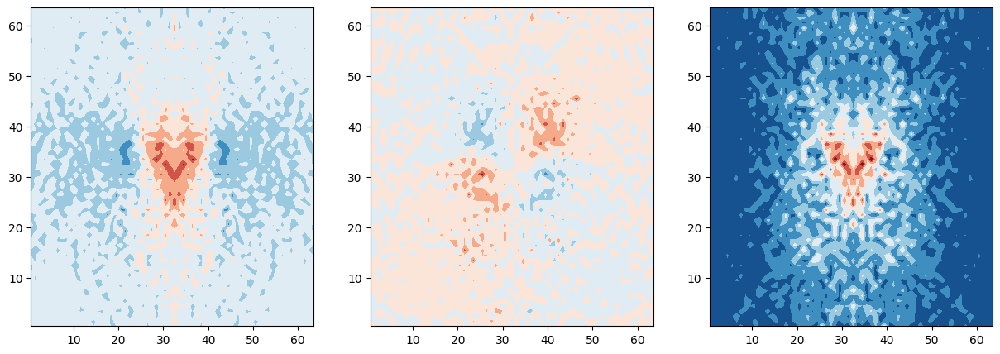

In [4]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.contourf(ux, cmap='RdBu_r', origin='lower' )

plt.subplot(1, 3, 2)
plt.contourf(uy, cmap='RdBu_r', origin='lower' )

plt.subplot(1, 3, 3)
plt.contourf(U_magnitude, cmap='RdBu_r', origin='lower' )


plt.show()


In [5]:
def vorticity(U_x, U_y, dx, dy):
    dU_y_dx, _ = np.gradient(U_y, dx, axis=0), np.gradient(U_y, dy, axis=1)
    _, dU_x_dy = np.gradient(U_x, dx, axis=0), np.gradient(U_x, dy, axis=1)
    return dU_y_dx - dU_x_dy


# 计算归一化的涡度
def vorticity_normalize(vorticity):
    max_vorticity = np.max(np.abs(vorticity))
    vort_normalized = vorticity / max_vorticity if max_vorticity != 0 else vorticity
    return vort_normalized

In [6]:
size_low = 64

dx = 2*np.pi/size_low
dy = 2*np.pi/size_low
dz = 2*np.pi/size_low

In [7]:
vort_test = vorticity(ux, uy, dx, dx)

vorticity_normalized = vorticity_normalize(vort_test)

print(vort_test.shape)
print(vorticity_normalized.shape)

(64, 64)
(64, 64)


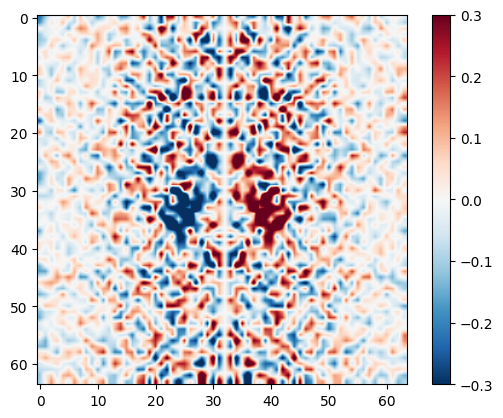

In [8]:
plt.imshow(vorticity_normalized, cmap='RdBu_r',vmin=-0.3,vmax=0.3,interpolation='bilinear')
plt.colorbar()

In [9]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, random_split
import cv2

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


In [11]:
U_x_tensor = torch.tensor(ux, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
U_y_tensor = torch.tensor(ux, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
U_magnitude_tensor = torch.tensor(U_magnitude, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)

In [12]:
all_velocity_fields = []
velocity_field = torch.cat((U_x_tensor, U_y_tensor, U_magnitude_tensor), dim=1)

all_velocity_fields.append(velocity_field)

all_velocity_fields = torch.cat(all_velocity_fields, dim=0)


In [13]:
num_samples = all_velocity_fields.shape[0]
size_low = all_velocity_fields.shape[2]
target_abcd = torch.zeros((num_samples, 4, size_low, size_low), dtype=torch.float32).to(device)
    # 创建数据集和数据加载器
dataset = TensorDataset(all_velocity_fields, target_abcd)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)  # 你可以根据需要调整batch_size

# 检查数据形状
print("all_velocity_fields shape:", all_velocity_fields.shape)
print("target_abcd shape:", target_abcd.shape)


all_velocity_fields shape: torch.Size([1, 3, 64, 64])
target_abcd shape: torch.Size([1, 4, 64, 64])


In [14]:
class BasicModelA(nn.Module):
    def __init__(self):
        super(BasicModelA, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(512)
        self.upsample = nn.Upsample(scale_factor=8, mode='bilinear', align_corners=True)
        self.conv5 = nn.Conv2d(512, 4, kernel_size=3, padding=1)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.pool(x)
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool(x)
        x = F.relu(self.bn3(self.conv3(x)))
        x = self.pool(x)
        x = F.relu(self.bn4(self.conv4(x)))
        x = self.upsample(x)
        x = self.conv5(x)
        return x


In [15]:
class ComplexModelA(nn.Module):
    def __init__(self):
        super(ComplexModelA, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(512)
        self.conv5 = nn.Conv2d(512, 1024, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(2, 2)
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.conv6 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.bn6 = nn.BatchNorm2d(512)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv7 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.bn7 = nn.BatchNorm2d(256)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv8 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.bn8 = nn.BatchNorm2d(128)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv9 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.bn9 = nn.BatchNorm2d(64)
        self.conv10 = nn.Conv2d(64, 4, kernel_size=3, padding=1)

    def forward(self, x):
        x1 = F.relu(self.bn1(self.conv1(x)))
        x2 = self.pool(x1)
        x2 = F.relu(self.bn2(self.conv2(x2)))
        x3 = self.pool(x2)
        x3 = F.relu(self.bn3(self.conv3(x3)))
        x4 = self.pool(x3)
        x4 = F.relu(self.bn4(self.conv4(x4)))
        x5 = self.pool(x4)
        x5 = F.relu(self.bn5(self.conv5(x5)))
        x = self.upconv1(x5)
        x = torch.cat((x, x4), dim=1)
        x = F.relu(self.bn6(self.conv6(x)))
        x = self.upconv2(x)
        x = torch.cat((x, x3), dim=1)
        x = F.relu(self.bn7(self.conv7(x)))
        x = self.upconv3(x)
        x = torch.cat((x, x2), dim=1)
        x = F.relu(self.bn8(self.conv8(x)))
        x = self.upconv4(x)
        x = torch.cat((x, x1), dim=1)
        x = F.relu(self.bn9(self.conv9(x)))
        x = self.conv10(x)
        return x


In [16]:
class ConstraintLayer(nn.Module):
    def __init__(self):
        super(ConstraintLayer, self).__init__()

    def forward(self, x):
        norm = torch.sqrt(x[:, 0, :, :]**2 + x[:, 1, :, :]**2 + x[:, 2, :, :]**2 + x[:, 3, :, :]**2 + 1e-8)
        norm = norm.unsqueeze(1)
        x = x / norm
        return x


In [17]:
class ModelAWithConstraints(nn.Module):
    def __init__(self):
        super(ModelAWithConstraints, self).__init__()
        self.model = BasicModelA()
        self.constraint_layer = ConstraintLayer()

    def forward(self, x):
        x = self.model(x)
        x = self.constraint_layer(x)
        return x


In [18]:
def calculate_gradients_with_numpy(tensor):
    tensor_np = tensor.detach().cpu().numpy()
    grad_x = np.gradient(tensor_np, axis=1)
    grad_y = np.gradient(tensor_np, axis=2)
    grad_x_tensor = torch.from_numpy(grad_x).to(tensor.device)
    grad_y_tensor = torch.from_numpy(grad_y).to(tensor.device)
    return grad_x_tensor, grad_y_tensor


In [19]:
def laplacian_2d_torch(tensor, dx, dy):
    tensor = tensor.float()
    tensor_np = tensor.detach().cpu().numpy()
    grad_x = np.gradient(tensor_np, axis=1)
    grad_y = np.gradient(tensor_np, axis=2)
    laplacian_x = np.gradient(grad_x, axis=1)
    laplacian_y = np.gradient(grad_y, axis=2)
    laplacian_x_tensor = torch.from_numpy(laplacian_x).to(tensor.device)
    laplacian_y_tensor = torch.from_numpy(laplacian_y).to(tensor.device)
    laplacian = laplacian_x_tensor + laplacian_y_tensor
    return laplacian


In [20]:
def loss_function(predicted_abcd, true_velocity, model, epsilon, l1_lambda=0.0, l2_lambda=0.0):

    a = predicted_abcd[:, 0, :, :]
    b = predicted_abcd[:, 1, :, :]
    c = predicted_abcd[:, 2, :, :]
    d = predicted_abcd[:, 3, :, :]

    a_grad_x, a_grad_y = calculate_gradients_with_numpy(a)
    b_grad_x, b_grad_y = calculate_gradients_with_numpy(b)
    c_grad_x, c_grad_y = calculate_gradients_with_numpy(c)
    d_grad_x, d_grad_y = calculate_gradients_with_numpy(d)

    # U_x_pred = a + b
    # U_y_pred = c + d
    # U_magnitude_pred = torch.sqrt(U_x_pred**2 + U_y_pred**2)

    # U_x_true = true_velocity[:, 0, :, :]
    # U_y_true = true_velocity[:, 1, :, :]
    # U_magnitude_true = true_velocity[:, 2, :, :]


    U_x_pred = hbar * (a * b_grad_x - b * a_grad_x + c * d_grad_x - d * c_grad_x)
    U_y_pred = hbar * (a * b_grad_y - b * a_grad_y + c * d_grad_y - d * c_grad_y)
    U_magnitude_pred = torch.sqrt(U_x_pred**2 + U_y_pred**2)
    
    # # 计算速度场的损失
    U_x_true = true_velocity[:, 0, :, :]
    U_y_true = true_velocity[:, 1, :, :]
    U_magnitude_true = true_velocity[:, 2, :, :]

    loss_velocity = F.mse_loss(U_magnitude_pred, U_magnitude_true) + F.mse_loss(U_x_pred, U_x_true) + F.mse_loss(U_y_pred, U_y_true)

    norm = a**2 + b**2 + c**2 + d**2
    norm_constraint = F.mse_loss(norm, torch.ones_like(norm))

    lap_b = laplacian_2d_torch(b, dx, dx)
    lap_a = laplacian_2d_torch(a, dx, dx)
    lap_d = laplacian_2d_torch(d, dx, dx)
    lap_c = laplacian_2d_torch(c, dx, dx)

    curl_constraint = (a * lap_b - b * lap_a + c * lap_d - d * lap_c).sum()

    l1_regularization = torch.tensor(0., requires_grad=True)

    if l1_lambda > 0:
        l1_regularization = sum(torch.sum(torch.abs(param)) for param in model.parameters())
    l2_regularization = torch.tensor(0., requires_grad=True)


    if l2_lambda > 0:
        l2_regularization = sum(torch.sum(param**2) for param in model.parameters())
    regularization_term = epsilon * 0.25 * (torch.sum(a**2) + torch.sum(b**2) + torch.sum(c**2) + torch.sum(d**2))

    total_loss = loss_velocity + l1_lambda * l1_regularization + l2_lambda * l2_regularization
    return total_loss


In [21]:
learning_rate = 0.00001
num_epochs = 180000
epsilon = 0.01
l1_lambda = 0.001
l2_lambda = 0.001
channels = 3
hbar = 1


In [22]:
model = ComplexModelA().to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
for epoch in range(num_epochs):
    for i, (velocity, _) in enumerate(dataloader):
        velocity = velocity.to(device)
        optimizer.zero_grad()
        predicted_abcd = model(velocity)
        loss = loss_function(predicted_abcd, velocity, model, epsilon, l1_lambda, l2_lambda)
        loss.backward()
        optimizer.step()
        if i % 10 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}], Loss: {loss.item():.4f}')


Epoch [1/180000], Step [1], Loss: 137.6944
Epoch [2/180000], Step [1], Loss: 137.5222
Epoch [3/180000], Step [1], Loss: 137.3502
Epoch [4/180000], Step [1], Loss: 137.1782
Epoch [5/180000], Step [1], Loss: 137.0063
Epoch [6/180000], Step [1], Loss: 136.8345
Epoch [7/180000], Step [1], Loss: 136.6628
Epoch [8/180000], Step [1], Loss: 136.4908
Epoch [9/180000], Step [1], Loss: 136.3187
Epoch [10/180000], Step [1], Loss: 136.1462
Epoch [11/180000], Step [1], Loss: 135.9735
Epoch [12/180000], Step [1], Loss: 135.8008
Epoch [13/180000], Step [1], Loss: 135.6279
Epoch [14/180000], Step [1], Loss: 135.4550
Epoch [15/180000], Step [1], Loss: 135.2820
Epoch [16/180000], Step [1], Loss: 135.1091
Epoch [17/180000], Step [1], Loss: 134.9363
Epoch [18/180000], Step [1], Loss: 134.7633
Epoch [19/180000], Step [1], Loss: 134.5898
Epoch [20/180000], Step [1], Loss: 134.4160
Epoch [21/180000], Step [1], Loss: 134.2418
Epoch [22/180000], Step [1], Loss: 134.0673
Epoch [23/180000], Step [1], Loss: 133.89

In [23]:
predicted_abcd.shape

torch.Size([1, 4, 64, 64])

In [24]:
predicted_abcd = predicted_abcd.cpu()  # 将预测结果移回CPU以便进行后续处理和可视化
a_pre = predicted_abcd[0,0,:,:].detach().numpy()
b_pre = predicted_abcd[0,1,:,:].detach().numpy()
c_pre = predicted_abcd[0,2,:,:].detach().numpy()
d_pre = predicted_abcd[0,3,:,:].detach().numpy()


In [25]:
a_test_grad_x, a_test_grad_y = np.gradient(a_pre, dx)
b_test_grad_x, b_test_grad_y = np.gradient(b_pre, dx)
c_test_grad_x, c_test_grad_y = np.gradient(c_pre, dx)
d_test_grad_x, d_test_grad_y = np.gradient(d_pre, dx)
U_x_pred_test = a_pre * b_test_grad_x - b_pre * a_test_grad_x + c_pre * d_test_grad_x - d_pre * c_test_grad_x

U_y_pred_test = a_pre * b_test_grad_y - b_pre * a_test_grad_y + c_pre * d_test_grad_y - d_pre * c_test_grad_y
U_magnitude_pred_test = np.sqrt(U_x_pred_test**2 + U_y_pred_test**2)



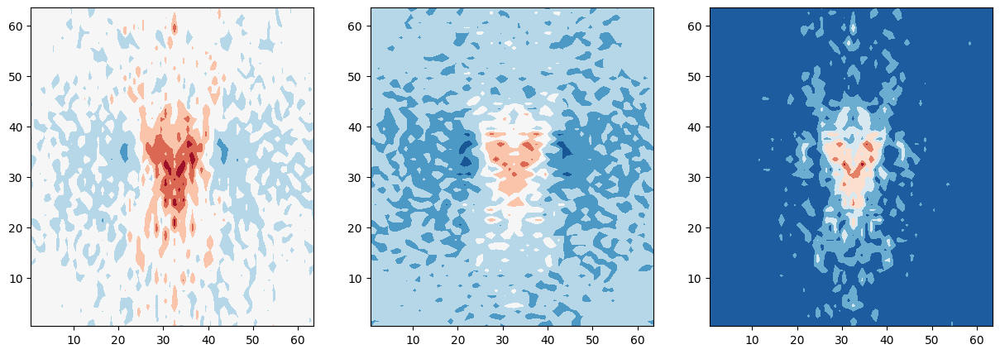

In [31]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.contourf(U_x_pred_test, cmap='RdBu_r', origin='lower' )

plt.subplot(1, 3, 2)
plt.contourf(U_y_pred_test, cmap='RdBu_r', origin='lower' )

plt.subplot(1, 3, 3)
plt.contourf(U_magnitude_pred_test, cmap='RdBu_r', origin='lower' )


plt.show()


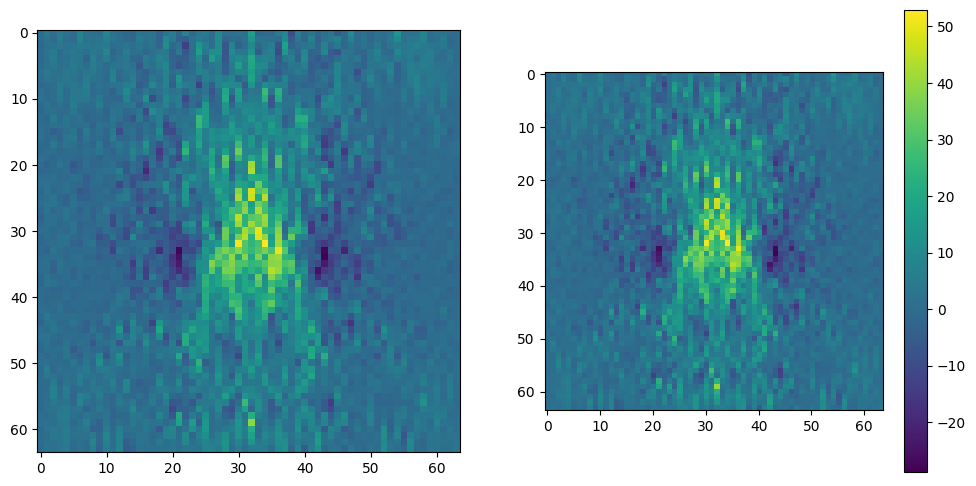

In [32]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(U_x_pred_test, cmap='viridis')
plt.subplot(1, 2, 2)
plt.imshow(U_x_pred_test-ux, cmap='viridis')
plt.colorbar()



In [33]:
def vorticity(U_x, U_y, dx, dy):
    dU_y_dx, _ = np.gradient(U_y, dx, axis=0), np.gradient(U_y, dy, axis=1)
    _, dU_x_dy = np.gradient(U_x, dx, axis=0), np.gradient(U_x, dy, axis=1)
    return dU_y_dx - dU_x_dy

def vorticity_normalize(vorticity):
    max_vorticity = np.max(np.abs(vorticity))
    vort_normalized = vorticity / max_vorticity if max_vorticity != 0 else vorticity
    return vort_normalized



In [34]:
vort_pre = vorticity(U_x_pred_test, U_y_pred_test, dx, dx)
vorticity_normalized_pre = vorticity_normalize(vort_pre)


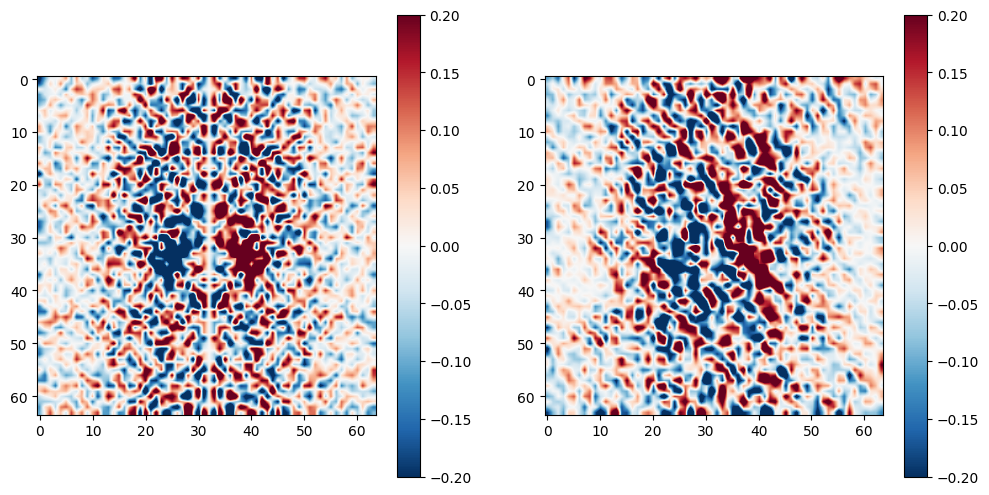

In [35]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(vorticity_normalized, cmap='RdBu_r',vmin=-0.2,vmax=0.2,interpolation='bilinear')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(vorticity_normalized_pre, cmap='RdBu_r', vmin=-0.2, vmax=0.2, interpolation='bilinear')
plt.colorbar()